# Doc2vec,Tsne,SpotifySongs,Genres,Langauges : Word embeddings (Document Embedding)

### Loading Libraries 

In [1]:
import pandas as pd
import numpy as np
from tqdm import tqdm
tqdm.pandas(desc="progress-bar")

from sklearn import utils
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

from gensim.models import Doc2Vec
import gensim
from gensim.models.doc2vec import TaggedDocument

import re
import seaborn as sns
import matplotlib.pyplot as plt



# Erase Warnings
import warnings
warnings.filterwarnings("ignore")

### Data Loading and Description (EDA) 

In [135]:
# Loading Dataset

songs_df = pd.read_csv("./final_spotify_songs.csv")
songs_df.head(5)

,track_id,track_name,track_artist,lyrics,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,language
0,0017A6SJgTbfQVU2EtsPNo,Pangarap,Barbie's Cradle,Minsan pa Nang ako'y napalingon Hindi ko alam ...,41,1srJQ0njEQgd8w4XSqI4JQ,Trip,2001-01-01,Pinoy Classic Rock,37i9dQZF1DWYDQ8wBxd7xt,...,-10.068,1,0.0236,0.27900,0.01170,0.0887,0.566,97.091,235440,tl
1,004s3t0ONYlzxII9PLgU6z,I Feel Alive,Steady Rollin,"The trees, are singing in the wind The sky blu...",28,3z04Lb9Dsilqw68SHt6jLB,Love & Loss,2017-11-21,Hard Rock Workout,3YouF0u7waJnolytf9JCXf,...,-4.739,1,0.0442,0.01170,0.00994,0.3470,0.404,135.225,373512,en
2,00chLpzhgVjxs1zKC9UScL,Poison,Bell Biv DeVoe,"NA Yeah, Spyderman and Freeze in full effect U...",0,6oZ6brjB8x3GoeSYdwJdPc,Gold,2005-01-01,"Back in the day - R&B, New Jack Swing, Swingbe...",3a9y4eeCJRmG9p4YKfqYIx,...,-7.504,0,0.2160,0.00432,0.00723,0.4890,0.650,111.904,262467,en
3,00cqd6ZsSkLZqGMlQCR0Zo,Baby It's Cold Outside (feat. Christina Aguilera),CeeLo Green,I really can't stay Baby it's cold outside I'v...,41,3ssspRe42CXkhPxdc12xcp,CeeLo's Magic Moment,2012-10-29,Christmas Soul,6FZYc2BvF7tColxO8PBShV,...,-5.819,0,0.0341,0.68900,0.00000,0.0664,0.405,118.593,243067,en
4,00emjlCv9azBN0fzuuyLqy,Dumb Litty,KARD,Get up out of my business You don't keep me fr...,65,7h5X3xhh3peIK9Y0qI5hbK,KARD 2nd Digital Single ‘Dumb Litty’,2019-09-22,K-Party Dance Mix,37i9dQZF1DX4RDXswvP6Mj,...,-1.993,1,0.0409,0.03700,0.00000,0.1380,0.240,130.018,193160,en


In [3]:
songs_df.shape

(18454, 25)

In [4]:
songs_df.describe()

,track_popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
count,18454.000000,18454.000000,18454.000000,18454.000000,18454.000000,18454.000000,18454.000000,18454.000000,18454.000000,18454.000000,18454.000000,18454.000000,18454.000000
mean,42.438821,0.644066,0.692289,5.342094,-6.769159,0.580525,0.106192,0.175348,0.051216,0.189593,0.520598,120.812167,230319.306763
std,24.616740,0.150071,0.180635,3.613121,2.920757,0.493487,0.102291,0.217795,0.168263,0.153751,0.228716,27.586424,57255.086685
min,0.000000,0.098500,0.016700,0.000000,-34.283000,0.000000,0.022400,0.000001,0.000000,0.009360,0.000010,37.114000,31893.000000
25%,24.000000,0.546000,0.573000,2.000000,-8.249000,0.000000,0.039700,0.016100,0.000000,0.092700,0.345000,98.856000,193230.250000
50%,48.000000,0.660000,0.715000,6.000000,-6.227000,1.000000,0.060300,0.081900,0.000009,0.128000,0.522000,120.045000,221340.000000
75%,62.000000,0.755000,0.835000,9.000000,-4.719000,1.000000,0.130000,0.254000,0.001720,0.246000,0.700000,135.984000,258078.250000
max,100.000000,0.979000,1.000000,11.000000,1.275000,1.000000,0.918000,0.992000,0.987000,0.996000,0.991000,214.047000,517810.000000


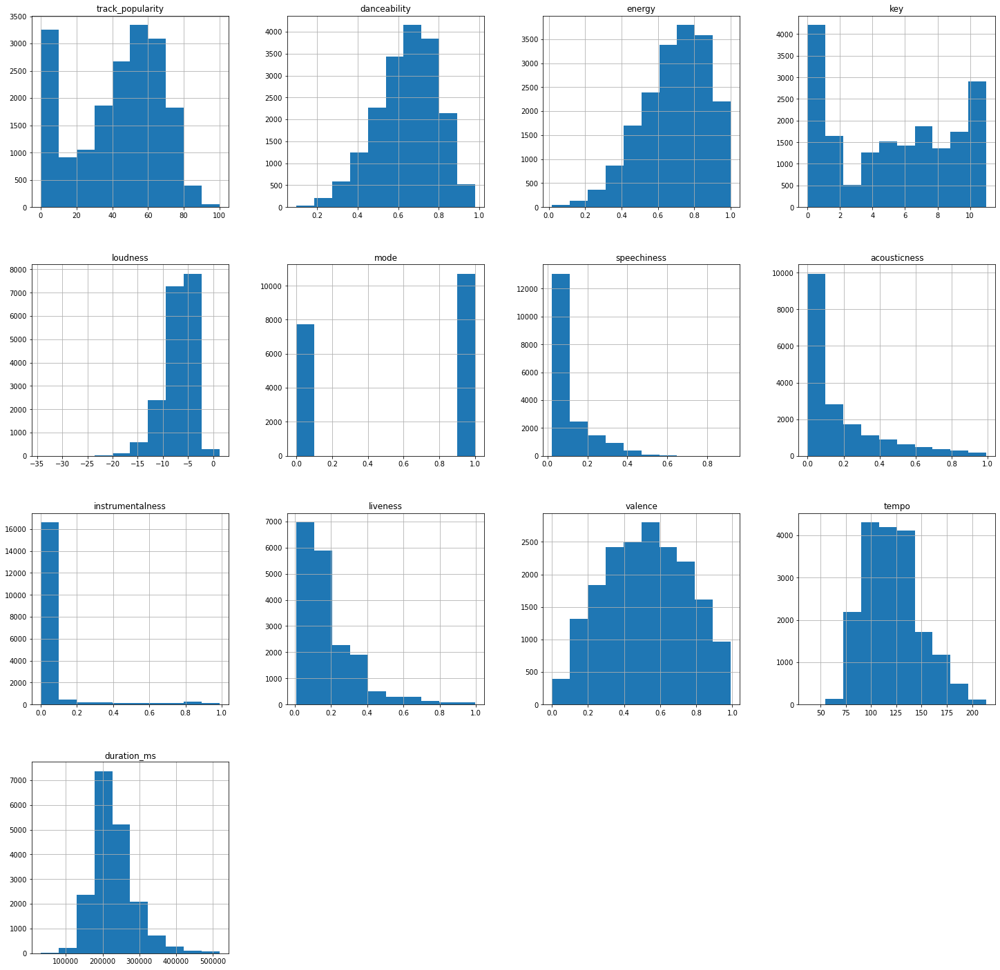

In [5]:
# plotting histograms
songs_df.hist(figsize=(25,25));

In [161]:
songs_df.corr()

,track_popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
track_popularity,1.000000,0.061499,-0.093521,-0.006878,0.031290,0.010947,-0.000622,0.076821,-0.080933,-0.059334,-0.004490,0.011954,-0.143970
danceability,0.061499,1.000000,-0.089708,0.002090,0.022830,-0.078020,0.204041,-0.029240,-0.049187,-0.114719,0.343419,-0.201465,-0.133803
energy,-0.093521,-0.089708,1.000000,0.018833,0.674795,-0.009903,-0.011986,-0.546033,0.042093,0.156931,0.207941,0.138291,-0.021134
key,-0.006878,0.002090,0.018833,1.000000,0.007280,-0.169589,0.026282,-0.002067,0.004243,0.000682,0.021927,-0.018967,0.016984
loudness,0.031290,0.022830,0.674795,0.007280,1.000000,-0.035276,0.029858,-0.370628,-0.099164,0.071159,0.050211,0.082558,-0.159026
mode,0.010947,-0.078020,-0.009903,-0.169589,-0.035276,1.000000,-0.070013,0.022191,-0.002906,0.004850,-0.009382,0.026421,0.012433
speechiness,-0.000622,0.204041,-0.011986,0.026282,0.029858,-0.070013,1.000000,-0.000217,-0.108365,0.060072,0.035202,0.033620,-0.094343
acousticness,0.076821,-0.029240,-0.546033,-0.002067,-0.370628,0.022191,-0.000217,1.000000,-0.015803,-0.067491,-0.069817,-0.096149,-0.052996
instrumentalness,-0.080933,-0.049187,0.042093,0.004243,-0.099164,-0.002906,-0.108365,-0.015803,1.000000,-0.000021,-0.103020,0.028126,0.078505
liveness,-0.059334,-0.114719,0.156931,0.000682,0.071159,0.004850,0.060072,-0.067491,-0.000021,1.000000,-0.006931,0.015658,0.026988


In [ ]:
 songs_df.corr().style.background_gradient(cmap = 'BrBG')  
 

In [6]:
songs_df.shape, songs_df.columns, songs_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18454 entries, 0 to 18453
Data columns (total 25 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   track_id                  18454 non-null  object 
 1   track_name                18454 non-null  object 
 2   track_artist              18454 non-null  object 
 3   lyrics                    18194 non-null  object 
 4   track_popularity          18454 non-null  int64  
 5   track_album_id            18454 non-null  object 
 6   track_album_name          18454 non-null  object 
 7   track_album_release_date  18454 non-null  object 
 8   playlist_name             18454 non-null  object 
 9   playlist_id               18454 non-null  object 
 10  playlist_genre            18454 non-null  object 
 11  playlist_subgenre         18454 non-null  object 
 12  danceability              18454 non-null  float64
 13  energy                    18454 non-null  float64
 14  key   

((18454, 25),
 Index(['track_id', 'track_name', 'track_artist', 'lyrics', 'track_popularity',
        'track_album_id', 'track_album_name', 'track_album_release_date',
        'playlist_name', 'playlist_id', 'playlist_genre', 'playlist_subgenre',
        'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
        'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
        'duration_ms', 'language'],
       dtype='object'),
 None)

In [7]:
#check null values
pd.isnull(songs_df).sum()

track_id                      0
track_name                    0
track_artist                  0
lyrics                      260
track_popularity              0
track_album_id                0
track_album_name              0
track_album_release_date      0
playlist_name                 0
playlist_id                   0
playlist_genre                0
playlist_subgenre             0
danceability                  0
energy                        0
key                           0
loudness                      0
mode                          0
speechiness                   0
acousticness                  0
instrumentalness              0
liveness                      0
valence                       0
tempo                         0
duration_ms                   0
language                    260
dtype: int64

In [8]:
songs_df.playlist_subgenre.drop_duplicates() 

0                  classic rock
1                     hard rock
2                new jack swing
3                      neo soul
4                     dance pop
5            urban contemporary
8                      big room
9                       hip pop
10                    latin pop
11              indie poptimism
13                 gangster rap
15                   album rock
17                post-teen pop
23                         trap
24                latin hip hop
27             southern hip hop
28                     tropical
29                   electropop
31    progressive electro house
32                      pop edm
44                    reggaeton
47                      hip hop
54               permanent wave
94                electro house
Name: playlist_subgenre, dtype: object

### Combining genres + lyrics + languages and creating a fetured document

In [9]:
df = pd.read_csv('final_spotify_songs.csv')
df = df[['playlist_genre','lyrics','language']]

df.head(10)

,playlist_genre,lyrics,language
0,rock,Minsan pa Nang ako'y napalingon Hindi ko alam ...,tl
1,rock,"The trees, are singing in the wind The sky blu...",en
2,r&b,"NA Yeah, Spyderman and Freeze in full effect U...",en
3,r&b,I really can't stay Baby it's cold outside I'v...,en
4,pop,Get up out of my business You don't keep me fr...,en
5,r&b,"Hold your breath, don't look down, keep trying...",en
6,r&b,All I want is somebody who's gonna love me for...,en
7,r&b,Feels good Everybody Tender lover Tender love ...,en
8,edm,"Don't run away, it's getting colder Our hearts...",en
9,r&b,Ho una cosa da dirti da tempo Ma non ho mai t...,it


In [10]:
df["new_column"] = df['playlist_genre'].astype(str) +"-"+ df["lyrics"]+"-"+ df["language"]
print(df)

      playlist_genre                                             lyrics  \
0               rock  Minsan pa Nang ako'y napalingon Hindi ko alam ...   
1               rock  The trees, are singing in the wind The sky blu...   
2                r&b  NA Yeah, Spyderman and Freeze in full effect U...   
3                r&b  I really can't stay Baby it's cold outside I'v...   
4                pop  Get up out of my business You don't keep me fr...   
...              ...                                                ...   
18449            edm  Caught up in such a head rush, wide-eyed latel...   
18450            pop  My anaconda don't, my anaconda don't My anacon...   
18451            r&b  Bound, bound Bound, bound Bound to fall in lov...   
18452            r&b  (Would you do for me) Sweetheart (Would you do...   
18453           rock  Oo nga pala, hindi nga pala tayo Hanggang dito...   

      language                                         new_column  
0           tl  rock-Minsan pa 

In [11]:
df["lyrics"]=df["new_column"]

In [12]:
df["lyrics"][5]

"r&b-Hold your breath, don't look down, keep trying Darling, it's okay to be scared, it's frightening At times it just feels like the world is trying hard to knock us down But there's a reason that we're still here but no one else is around How we've grown Every single day I'm proud I swear, I won't Let anything stop us now I'm not a soldier But I'll fight through our darkest of days Get on my shoulders And I'll carry you all of the way'Cause there's no life worth living in If you're not with me in it I'm not a soldier But you make me wanna be brave Yeah, you do Through the depths of despair, we've stumbled And all that distance between us, we've crumbled We've ignored all of the rumours and jealous disapprovals And we've come out the other side with something beautiful Oh, how we've grown Every single day I'm proud And now I know There's nothing that can stop us now I'm not a soldier But I'll fight through our darkest of days Get on my shoulders And I'll carry you all of the way 'Caus

In [13]:
df=df.dropna()

In [14]:
df.isnull().sum()

playlist_genre    0
lyrics            0
language          0
new_column        0
dtype: int64

In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18194 entries, 0 to 18453
Data columns (total 4 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   playlist_genre  18194 non-null  object
 1   lyrics          18194 non-null  object
 2   language        18194 non-null  object
 3   new_column      18194 non-null  object
dtypes: object(4)
memory usage: 710.7+ KB


In [16]:
df.shape

(18194, 4)

In [17]:
df.index = range(18194)
df['lyrics'].apply(lambda x: len(x.split(' '))).sum()

7748768

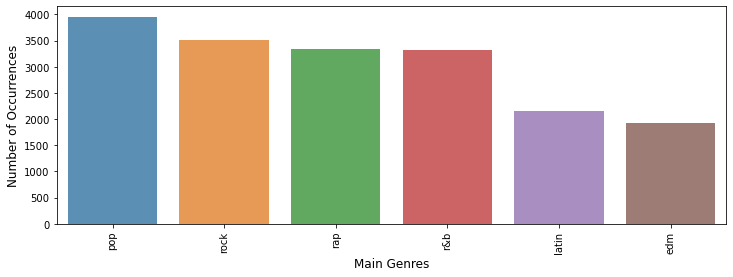

In [18]:
cnt_pro = df['playlist_genre'].value_counts()
plt.figure(figsize=(12,4))
sns.barplot(cnt_pro.index, cnt_pro.values, alpha=0.8)
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('Main Genres', fontsize=12)
plt.xticks(rotation=90)
plt.show();

In [19]:
def print_complaint(index):
    example = df[df.index == index][['lyrics', 'playlist_genre']].values[0]
    if len(example) > 0:
        print(example[0])
        print('playlist_genre:', example[1])
        
print_complaint(2)

r&b-NA Yeah, Spyderman and Freeze in full effect Uh-huh You ready, Ron? I'm ready You ready, Biv? I'm ready, Slick, are you? Oh, yeah, break it down NA Girl, I, must (warn you) I sense something strange in my mind Situation is (serious) Let's cure it cause we're running out of time It's oh, so (beautiful) Relationships they seem from the start It's all so (deadly) When love is not together from the heart It's drivin' me out of my mind! That's why it's HARD for me to find Can't get it out of my head! Miss her, kiss her, love her(Wrong move you're dead!) That girl is (poison)...Never trust a big butt and smile That girl is (poison)..("POISON!!") NA (-caution) Before I start to meet a fly girl, you know? Cause in some (portions) You'll think she's the best thing in the world She's so - (fly) She'll drive you right out of your mind And steal your heart when you're blind Beware she's schemin', she'll make you think you're dreamin' YOU'LL fall in love and you'll be screamin', demon, HOO.. Po

In [20]:
from bs4 import BeautifulSoup
def cleanText(text):
    text = BeautifulSoup(text, "lxml").text
    text = re.sub(r'\|\|\|', r' ', text) 
    text = re.sub(r'http\S+', r'<URL>', text)
    text = text.lower()
    text = text.replace('x', '')
    return text
df['lyrics'] = df['lyrics'].apply(cleanText)

df['lyrics'][2]

'r&b-na yeah, spyderman and freeze in full effect uh-huh you ready, ron? i\'m ready you ready, biv? i\'m ready, slick, are you? oh, yeah, break it down na girl, i, must (warn you) i sense something strange in my mind situation is (serious) let\'s cure it cause we\'re running out of time it\'s oh, so (beautiful) relationships they seem from the start it\'s all so (deadly) when love is not together from the heart it\'s drivin\' me out of my mind! that\'s why it\'s hard for me to find can\'t get it out of my head! miss her, kiss her, love her(wrong move you\'re dead!) that girl is (poison)...never trust a big butt and smile that girl is (poison)..("poison!!") na (-caution) before i start to meet a fly girl, you know? cause in some (portions) you\'ll think she\'s the best thing in the world she\'s so - (fly) she\'ll drive you right out of your mind and steal your heart when you\'re blind beware she\'s schemin\', she\'ll make you think you\'re dreamin\' you\'ll fall in love and you\'ll be s

##### Removing stopwords (eliminate unimportant words, allowing applications to focus on the important words instead)

In [21]:
train, test = train_test_split(df, test_size=0.3, random_state=42)
import nltk
from nltk.corpus import stopwords
def tokenize_text(text):
    tokens = []
    for sent in nltk.sent_tokenize(text):
        for word in nltk.word_tokenize(sent):
            if len(word) < 2:
                continue
            tokens.append(word.lower())
    return tokens

train_tagged = train.apply(
    lambda r: TaggedDocument(words=tokenize_text(r['lyrics']), tags=[r.playlist_genre]), axis=1)
test_tagged = test.apply(
    lambda r: TaggedDocument(words=tokenize_text(r['lyrics']), tags=[r.playlist_genre]), axis=1)

In [22]:
train_tagged.values[2]

TaggedDocument(words=['pop-i', 'woke', 'up', 'it', 'was', 'waited', "'til", '11', 'just', 'to', 'figure', 'out', 'that', 'no', 'one', 'would', 'call', 'think', "'ve", 'got', 'lot', 'of', 'friends', 'but', 'do', "n't", 'hear', 'from', 'them', 'what', "'s", 'another', 'night', 'all', 'alone', 'when', 'you', "'re", 'spending', 'everyday', 'on', 'your', 'own', 'and', 'here', 'it', 'goes', "'m", 'just', 'kid', 'and', 'life', 'is', 'nightmare', "'m", 'just', 'kid', 'know', 'that', 'it', "'s", 'not', 'fair', 'nobody', 'cares', "'cause", "'m", 'alone', 'and', 'the', 'world', 'is', 'having', 'more', 'fun', 'than', 'me', 'tonight', 'and', 'maybe', 'when', 'the', 'night', 'is', 'dead', "'ll", 'crawl', 'into', 'my', 'bed', "'m", 'staring', 'at', 'these', 'four', 'walls', 'again', "'ll", 'try', 'to', 'think', 'about', 'the', 'last', 'time', 'had', 'good', 'time', 'everyone', "'s", 'got', 'somewhere', 'to', 'go', 'and', 'they', "'re", 'gon', 'na', 'leave', 'me', 'here', 'on', 'my', 'own', 'and', 'he

In [23]:
import multiprocessing
cores = multiprocessing.cpu_count()

#### Document embeddings with Doc2Vec (extension of Word2vec) 

In [24]:
model_dbow = Doc2Vec(dm=0, vector_size=300, negative=5, hs=0, min_count=2, sample = 0, workers=cores)
model_dbow.build_vocab([x for x in tqdm(train_tagged.values)])

100%|████████████████████████████████████████████████████████████████████████| 12735/12735 [00:00<00:00, 851090.85it/s]


In [25]:
%%time
for epoch in range(30):
    model_dbow.train(utils.shuffle([x for x in tqdm(train_tagged.values)]), total_examples=len(train_tagged.values), epochs=1)
    model_dbow.alpha -= 0.002
    model_dbow.min_alpha = model_dbow.alpha

100%|████████████████████████████████████████████████████████████████████████| 12735/12735 [00:00<00:00, 633285.45it/s]


CPU times: total: 9min 59s
Wall time: 3min 25s


In [26]:
def vec_for_learning(model, tagged_docs):
    sents = tagged_docs.values
    targets, regressors = zip(*[(doc.tags[0], model.infer_vector(doc.words)) for doc in sents])
    return targets, regressors

def vec_for_learning(model, tagged_docs):
    sents = tagged_docs.values
    targets, regressors = zip(*[(doc.tags[0], model.infer_vector(doc.words)) for doc in sents])
    return targets, regressors

In [27]:
y_train, X_train = vec_for_learning(model_dbow, train_tagged)
y_test, X_test = vec_for_learning(model_dbow, test_tagged)


In [28]:
X_train[0]

array([ 0.12776385, -0.34752703,  0.5917772 , -0.4151879 ,  0.24446405,
        0.19634247, -0.17245373, -0.3145219 , -0.16556837,  0.8384734 ,
        0.24948435,  0.19812529, -0.09236781, -0.7852816 , -0.6394208 ,
        0.53060925, -0.41110063,  0.37662256, -0.20300746, -0.17487586,
       -0.05667151, -0.28930315, -0.381548  , -0.736375  , -0.26568067,
       -0.36380497,  0.30748245,  0.08442096,  0.22642122,  0.44361725,
        0.05440766, -0.14296634, -0.1761249 , -0.56881636,  0.18493986,
       -0.15294679,  0.17976733,  0.6629474 , -0.20629647,  0.40015942,
       -0.05089117, -0.24609964,  0.35218936, -0.4626624 ,  0.5260573 ,
        0.08539285,  0.58064514, -0.40153688, -0.38637626, -1.082219  ,
        0.6153424 , -0.42065603,  0.5509572 , -0.5536649 ,  0.16550022,
        0.79277766,  0.6752136 , -0.36678347,  0.6510203 ,  0.32869446,
        0.04762083, -0.4560007 ,  0.29112023,  0.17744328, -0.26977062,
       -0.323952  ,  0.05611678, -0.00627052,  0.37853196, -0.78

#### K Means Clustering

In [29]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
model = KMeans(n_clusters = 6,init='k-means++',random_state=49)
model.fit(X_train)

KMeans(n_clusters=6, random_state=49)

In [30]:
labels = model.labels_
cluster_center=model.cluster_centers_

In [31]:
cluster_center

array([[ 0.2656728 , -0.78730868,  1.18632355, ...,  1.08056061,
         1.36193921, -0.10905286],
       [ 0.15669746, -0.37747584,  0.56333072, ...,  0.58015915,
         0.66000009, -0.16227629],
       [ 0.23946014, -0.59659363,  0.73184981, ...,  0.86779929,
         1.02374778, -0.12044032],
       [ 0.2648748 , -0.53236861,  0.5722095 , ...,  0.54758957,
         0.65502201, -0.32799023],
       [ 0.09959295, -0.17749226,  0.14872649, ...,  0.15019254,
         0.17358959, -0.06032417],
       [ 0.20734186, -0.46250033,  0.53614387, ...,  0.692884  ,
         0.78611562, -0.15323456]])

In [32]:
labels

array([1, 5, 5, ..., 0, 1, 3])

In [33]:
from sklearn import metrics
silhouette_score = metrics.silhouette_score(X_train, labels, metric='euclidean')

In [34]:
silhouette_score

0.20860021

In [35]:
import numpy as np

In [36]:
data_point=cluster_center[1]

In [37]:
centroid=cluster_center[2]

In [38]:
distance = np.sqrt(np.sum((data_point - centroid)**2))

In [39]:
distance

2.784726366098157

In [40]:
data_point=cluster_center[2]
centroid=X_train[4]
distance = np.sqrt(np.sum((data_point - centroid)**2))
distance

2.276749789651932

In [41]:
cluster_center[1]

array([ 0.15669746, -0.37747584,  0.56333072, -0.3436771 ,  0.23806828,
        0.20545375, -0.20951374, -0.33684916, -0.29884296,  0.86152971,
        0.34490462,  0.23035934,  0.03962654, -0.99548163, -0.73149179,
        0.6508273 , -0.62106251,  0.4928768 , -0.29291159, -0.11399004,
       -0.16678923, -0.29191684, -0.46732394, -0.89265952, -0.33062966,
       -0.45330555,  0.36987824,  0.09416972,  0.22124622,  0.53099538,
        0.2098581 , -0.1741517 , -0.32190169, -0.67064151,  0.30293194,
       -0.31394853,  0.15252237,  0.81787887, -0.14590005,  0.4751827 ,
       -0.05523229, -0.3089569 ,  0.45678912, -0.65931483,  0.64324336,
        0.10697109,  0.69646815, -0.50222441, -0.35270175, -1.18723736,
        0.63649413, -0.49069362,  0.60696078, -0.58388938,  0.30655589,
        0.98656955,  0.77041665, -0.47173895,  0.69141268,  0.46037748,
        0.05780223, -0.46651046,  0.38013554,  0.29925788, -0.27417538,
       -0.32872539,  0.05950194, -0.10095569,  0.46437574, -1.05

In [42]:
X_train[0]

array([ 0.12776385, -0.34752703,  0.5917772 , -0.4151879 ,  0.24446405,
        0.19634247, -0.17245373, -0.3145219 , -0.16556837,  0.8384734 ,
        0.24948435,  0.19812529, -0.09236781, -0.7852816 , -0.6394208 ,
        0.53060925, -0.41110063,  0.37662256, -0.20300746, -0.17487586,
       -0.05667151, -0.28930315, -0.381548  , -0.736375  , -0.26568067,
       -0.36380497,  0.30748245,  0.08442096,  0.22642122,  0.44361725,
        0.05440766, -0.14296634, -0.1761249 , -0.56881636,  0.18493986,
       -0.15294679,  0.17976733,  0.6629474 , -0.20629647,  0.40015942,
       -0.05089117, -0.24609964,  0.35218936, -0.4626624 ,  0.5260573 ,
        0.08539285,  0.58064514, -0.40153688, -0.38637626, -1.082219  ,
        0.6153424 , -0.42065603,  0.5509572 , -0.5536649 ,  0.16550022,
        0.79277766,  0.6752136 , -0.36678347,  0.6510203 ,  0.32869446,
        0.04762083, -0.4560007 ,  0.29112023,  0.17744328, -0.26977062,
       -0.323952  ,  0.05611678, -0.00627052,  0.37853196, -0.78

In [43]:
x1=list(X_train)

In [44]:
plot_list1=[]

In [45]:
cluster_center

array([[ 0.2656728 , -0.78730868,  1.18632355, ...,  1.08056061,
         1.36193921, -0.10905286],
       [ 0.15669746, -0.37747584,  0.56333072, ...,  0.58015915,
         0.66000009, -0.16227629],
       [ 0.23946014, -0.59659363,  0.73184981, ...,  0.86779929,
         1.02374778, -0.12044032],
       [ 0.2648748 , -0.53236861,  0.5722095 , ...,  0.54758957,
         0.65502201, -0.32799023],
       [ 0.09959295, -0.17749226,  0.14872649, ...,  0.15019254,
         0.17358959, -0.06032417],
       [ 0.20734186, -0.46250033,  0.53614387, ...,  0.692884  ,
         0.78611562, -0.15323456]])

In [46]:
plot_list3=[]
for pp in range(len(cluster_center)):
    
    plot_list3.append(x1[pp][0])
    
    
plot_list4=[]
for pp in range(len(cluster_center)):
    
    plot_list4.append(x1[pp][1])
    

In [47]:
plot_list1=[]
for pp in range(len(x1)):
    
    plot_list1.append(x1[pp][0])
    

In [48]:
plot_list2=[]
for pp in range(len(x1)):
    
    plot_list2.append(x1[pp][1])
    

<AxesSubplot:xlabel='feature1', ylabel='feature2'>

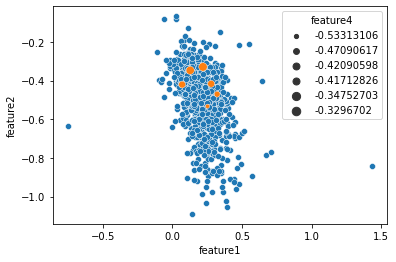

In [49]:
# inputs
feature1 = plot_list1[0:1000]
feature2= plot_list2[0:1000]
feature3= plot_list3
feature4= plot_list4
# convert to pandas dataframe
d = {'feature1': feature1, 'feature2': feature2}
pdnumsqr = pd.DataFrame(d)


d1 = {'feature3': feature3,'feature4': feature4}
pdnumsqr1 = pd.DataFrame(d1)
# plot using lineplot
#sns.set(style='darkgrid')
#sns.lineplot(x='num', y='sqr', data=pdnumsqr)

sns.scatterplot(x='feature1', y='feature2', data=pdnumsqr)
sns.scatterplot(x='feature3', y='feature4', data=pdnumsqr1, size="feature4")

Text(0, 0.5, 'Inertia')

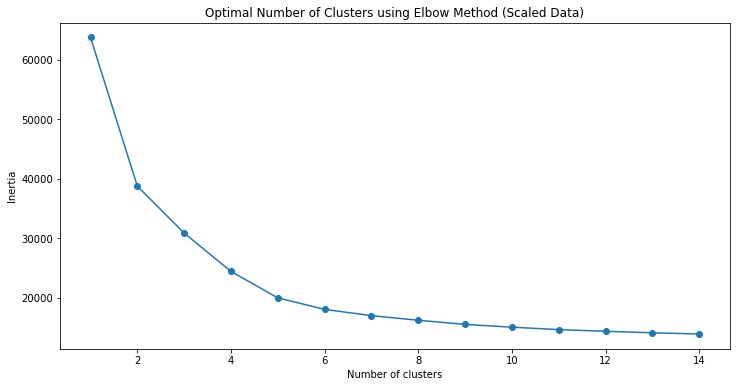

In [50]:
sse = []
k_list = range(1, 15)
for k in k_list:
    km = KMeans(n_clusters=k)
    km.fit(X_train)
    sse.append([k, km.inertia_])
    
oca_results_scale = pd.DataFrame({'Cluster': range(1,15), 'SSE': sse})
plt.figure(figsize=(12,6))
plt.plot(pd.DataFrame(sse)[0], pd.DataFrame(sse)[1], marker='o')
plt.title('Optimal Number of Clusters using Elbow Method (Scaled Data)')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')

In [51]:
df_scale2 = X_train
kmeans_scale = KMeans(n_clusters=6, n_init=100, max_iter=400, init='k-means++', random_state=42).fit(df_scale2)
#print('KMeans Scaled Silhouette Score: {}'.format(silhouette_score(df_scale2, kmeans_scale.labels_, metric='euclidean')))
labels_scale = kmeans_scale.labels_
clusters_scale = pd.concat([df, pd.DataFrame({'cluster_scaled':labels_scale})], axis=1)

In [52]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score

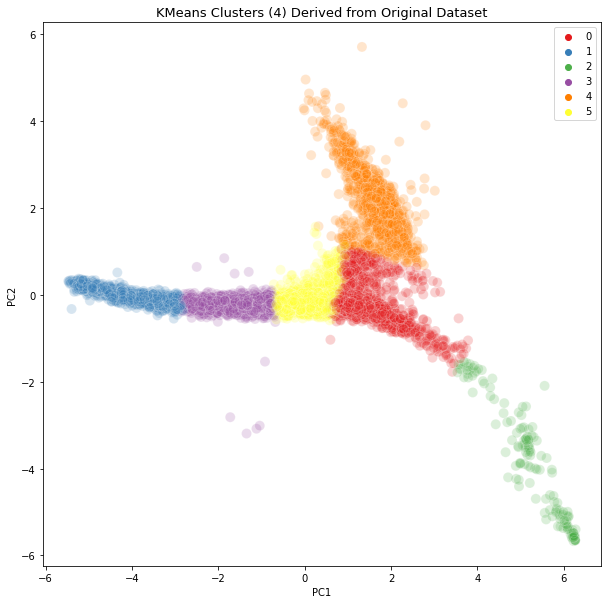

In [53]:
pca2 = PCA(n_components=3).fit(X_train)
pca2d = pca2.transform(X_train)
plt.figure(figsize = (10,10))
sns.scatterplot(pca2d[:,0], pca2d[:,1], 
                hue=labels_scale, 
                palette='Set1',
                s=100, alpha=0.2).set_title('KMeans Clusters (4) Derived from Original Dataset', fontsize=13)
plt.legend()
plt.ylabel('PC2')
plt.xlabel('PC1')
plt.show()

In [54]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
import plotly.offline as pyo
pyo.init_notebook_mode()
import plotly.graph_objs as go
from plotly import tools
from plotly.subplots import make_subplots
import plotly.offline as py
import plotly.express as px

In [55]:
Scene = dict(xaxis = dict(title  = 'PC1'),yaxis = dict(title  = 'PC2'),zaxis = dict(title  = 'PC3'))
labels = labels_scale
trace = go.Scatter3d(x=pca2d[:,0], y=pca2d[:,1], z=pca2d[:,2], mode='markers',marker=dict(color = labels, colorscale='Viridis', size = 10, line = dict(color = 'gray',width = 5)))
layout = go.Layout(margin=dict(l=0,r=0),scene = Scene, height = 1000,width = 1000)
data = [trace]
fig = go.Figure(data = data, layout = layout)
fig.show()

### TSNE Feature vector over the genres and languages

In [56]:
# TODO: recreate the feature vector that contains just
# the musical features in the dataframe, ie, acousticness, mode, 
# dancability, etc. 

features = ["track_popularity", "danceability", "energy", "key",
            "loudness", "mode", "speechiness" ,"acousticness",
            "instrumentalness", "liveness", "valence", "tempo", "duration_ms"]

feature_vector = songs_df[features]

In [57]:
tsne = TSNE(n_components=2, verbose=1, random_state=0)
w_features = tsne.fit_transform(feature_vector) 

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 18454 samples in 0.231s...
[t-SNE] Computed neighbors for 18454 samples in 0.736s...
[t-SNE] Computed conditional probabilities for sample 1000 / 18454
[t-SNE] Computed conditional probabilities for sample 2000 / 18454
[t-SNE] Computed conditional probabilities for sample 3000 / 18454
[t-SNE] Computed conditional probabilities for sample 4000 / 18454
[t-SNE] Computed conditional probabilities for sample 5000 / 18454
[t-SNE] Computed conditional probabilities for sample 6000 / 18454
[t-SNE] Computed conditional probabilities for sample 7000 / 18454
[t-SNE] Computed conditional probabilities for sample 8000 / 18454
[t-SNE] Computed conditional probabilities for sample 9000 / 18454
[t-SNE] Computed conditional probabilities for sample 10000 / 18454
[t-SNE] Computed conditional probabilities for sample 11000 / 18454
[t-SNE] Computed conditional probabilities for sample 12000 / 18454
[t-SNE] Computed conditional probabilities for sam

In [58]:
len(w_features)

18454

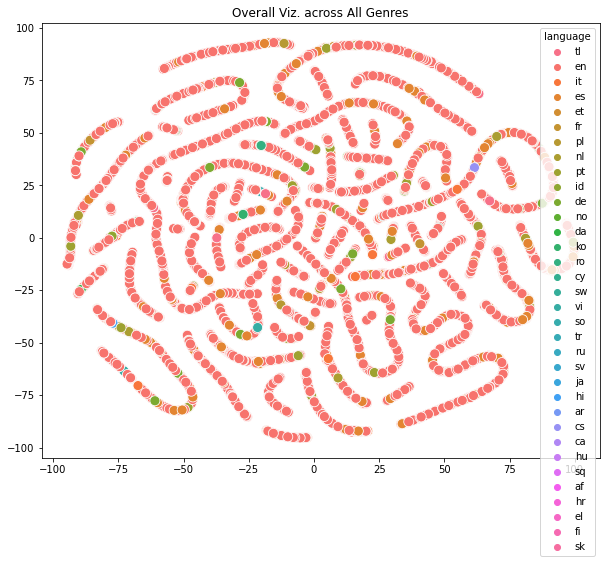

In [59]:
comp0 = w_features[:,0]
comp1 = w_features[:,1]
sns.scatterplot(x=comp0, y=comp1,s=100, hue=songs_df["language"],
                data=feature_vector).set(title="Overall Viz. across All Genres"),
# Change seaborn plot size
fig = plt.gcf()
fig.set_size_inches(10, 8)

## Let us work on sub genres now

In [60]:
songs_df = songs_df[['playlist_subgenre','lyrics','language']]

songs_df.head(10)

,playlist_subgenre,lyrics,language
0,classic rock,Minsan pa Nang ako'y napalingon Hindi ko alam ...,tl
1,hard rock,"The trees, are singing in the wind The sky blu...",en
2,new jack swing,"NA Yeah, Spyderman and Freeze in full effect U...",en
3,neo soul,I really can't stay Baby it's cold outside I'v...,en
4,dance pop,Get up out of my business You don't keep me fr...,en
5,urban contemporary,"Hold your breath, don't look down, keep trying...",en
6,new jack swing,All I want is somebody who's gonna love me for...,en
7,new jack swing,Feels good Everybody Tender lover Tender love ...,en
8,big room,"Don't run away, it's getting colder Our hearts...",en
9,hip pop,Ho una cosa da dirti da tempo Ma non ho mai t...,it


In [61]:
songs_df["new_column"] = songs_df['playlist_subgenre'].astype(str) +"-"+ songs_df["lyrics"]+"-"+ songs_df["language"]
print(songs_df)

               playlist_subgenre  \
0                   classic rock   
1                      hard rock   
2                 new jack swing   
3                       neo soul   
4                      dance pop   
...                          ...   
18449  progressive electro house   
18450                 electropop   
18451                   neo soul   
18452             new jack swing   
18453               classic rock   

                                                  lyrics language  \
0      Minsan pa Nang ako'y napalingon Hindi ko alam ...       tl   
1      The trees, are singing in the wind The sky blu...       en   
2      NA Yeah, Spyderman and Freeze in full effect U...       en   
3      I really can't stay Baby it's cold outside I'v...       en   
4      Get up out of my business You don't keep me fr...       en   
...                                                  ...      ...   
18449  Caught up in such a head rush, wide-eyed latel...       en   
18450  My anaco

In [62]:
songs_df['playlist_subgenre'].unique()

array(['classic rock', 'hard rock', 'new jack swing', 'neo soul',
       'dance pop', 'urban contemporary', 'big room', 'hip pop',
       'latin pop', 'indie poptimism', 'gangster rap', 'album rock',
       'post-teen pop', 'trap', 'latin hip hop', 'southern hip hop',
       'tropical', 'electropop', 'progressive electro house', 'pop edm',
       'reggaeton', 'hip hop', 'permanent wave', 'electro house'],
      dtype=object)

In [63]:
len(['classic rock', 'hard rock', 'new jack swing', 'neo soul',
       'dance pop', 'urban contemporary', 'big room', 'hip pop',
       'latin pop', 'indie poptimism', 'gangster rap', 'album rock',
       'post-teen pop', 'trap', 'latin hip hop', 'southern hip hop',
       'tropical', 'electropop', 'progressive electro house', 'pop edm',
       'reggaeton', 'hip hop', 'permanent wave', 'electro house'])

24

In [64]:
songs_df["lyrics"]=songs_df["new_column"]

In [65]:
songs_df["lyrics"][0]

"classic rock-Minsan pa Nang ako'y napalingon Hindi ko alam Na ika'y tutugon Sa mga tanong na aking nabitawan Hindi ko alam kung ito'y totoo Pangarap ka Sa bawat sandali Langit man ang tingin ko Sayo sana'y marating Hanggang dito na lang yata Ang kaya kong gawin Mangarap na lang At bumulong sa hangin Kailan kaya Darating ulit ang isang Sandali Na ako'y lilingon muli Pangarap ka o tinig mong kay lamig Ang iyong mga ngiti na sa akin ay Nakapagbigay pansin (Ikaw ba ay isang pangarap lang) Pangarap ka o tinig mong kay lamig Ang iyong mga ngiti Na sa akin ay Nakapagbigay... Pangarap ka o tinig mong kay lamig Ang iyong mga ngiti Na sa akin ay Nakapagbigay Pangarap ka o tinig mong kay lamig Ang iyong mga ngiti Na sa akin ay Nakapagbigay pansin-tl"

In [66]:
songs_df=songs_df.dropna()

songs_df.isnull().sum()

playlist_subgenre    0
lyrics               0
language             0
new_column           0
dtype: int64

In [67]:
songs_df.info()

songs_df.shape

songs_df.index = range(18194)
songs_df['lyrics'].apply(lambda x: len(x.split(' '))).sum()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 18194 entries, 0 to 18453
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   playlist_subgenre  18194 non-null  object
 1   lyrics             18194 non-null  object
 2   language           18194 non-null  object
 3   new_column         18194 non-null  object
dtypes: object(4)
memory usage: 710.7+ KB


7767775

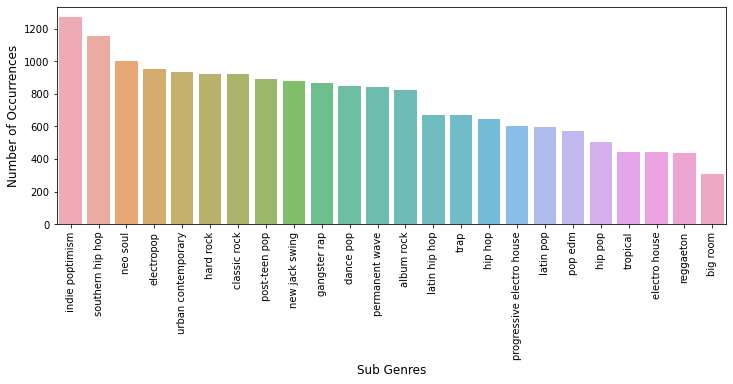

In [68]:
cnt_pro =songs_df['playlist_subgenre'].value_counts()
plt.figure(figsize=(12,4))
sns.barplot(cnt_pro.index, cnt_pro.values, alpha=0.8)
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('Sub Genres', fontsize=12)
plt.xticks(rotation=90)
plt.show();

In [69]:
def print_complaint(index):
    example = songs_df[songs_df.index == index][['lyrics', 'playlist_subgenre']].values[0]
    if len(example) > 0:
        print(example[0])
        print('playlist_subgenre', example[1])
print_complaint(12)

latin pop-Ihhh-yo! Ihhh-ye! Sonó la campana y el fin de semana se deja ver (Sha-la-la, la-la-la) Vestido, de traje, lujuria salvaje bajo mi piel Si Dios puso la manzana fue para morder Ay, Dios! Pequemo' abrazaditos hasta el amanecer Llego la fiesta, pa' tu boquita Toda la noche, todito el día Vamo' a bañarnos en la orillita Que la marea está pica'ita-ita-ita Una mordidita, una mordidita Una mordidita, de tu boquita Una mordidita, una mordidita Una mordidita, de tu boquita Tus labios, mis dientes Bocado crujiente, rico pastel Fuego en tus pupilas, tu cuerpo destila tequila y miel Si Dios puso la manzana fue para morder Ay, Dios! Pequemo' abrazaditos hasta el amanecer Llego la fiesta, pa' tu boquita Toda la noche, todito el día Vamo' a bañarnos en la orillita Que la marea está pica'ita-ita-ita Una mordidita, una mordidita Una mordidita, de tu boquita Una mordidita, una mordidita Una mordidita, de tu boquita Quiero pensar, que no eres real Me parece natural, letal, así te pones a bailar 

In [70]:
from bs4 import BeautifulSoup
def cleanText(text):
    text = BeautifulSoup(text, "lxml").text
    text = re.sub(r'\|\|\|', r' ', text) 
    text = re.sub(r'http\S+', r'<URL>', text)
    text = text.lower()
    text = text.replace('x', '')
    return text
songs_df['lyrics'] = songs_df['lyrics'].apply(cleanText)


In [71]:
train, test = train_test_split(songs_df, test_size=0.3, random_state=42)

import nltk
from nltk.corpus import stopwords
def tokenize_text(text):
    tokens = []
    for sent in nltk.sent_tokenize(text):
        for word in nltk.word_tokenize(sent):
            if len(word) < 2:
                continue
            tokens.append(word.lower())
    return tokens
train_tagged = train.apply(
    lambda r: TaggedDocument(words=tokenize_text(r['lyrics']), tags=[r.playlist_subgenre ]), axis=1)
test_tagged = test.apply(
    lambda r: TaggedDocument(words=tokenize_text(r['lyrics']), tags=[r.playlist_subgenre ]), axis=1)

In [72]:
train_tagged.values[30]

TaggedDocument(words=['hip', 'pop-portami', 'sentire', 'le', 'onde', 'del', 'mare', 'portami', 'vicino', 'le', 'cose', 'lontane', 'portami', 'dovunque', 'basta', 'che', 'ci', 'sia', 'posto', 'per', 'una', 'birra', 'qualche', 'vecchio', 'rimpianto', 'portami', 'sentire', 'il', 'rumore', 'del', 'vento', 'che', 'tanto', 'torneresti', 'in', 'qualsiasi', 'momento', 'portami', 'dovunque', 'basta', 'che', 'ci', 'sia', 'posto', 'per', 'un', 'sorriso', 'qualche', 'vecchio', 'rimpianto', 'dove', 'vuoi', 'non', 'dove', 'sai', 'dove', 'esisti', 'non', 'ci', 'sei', 'portami', 'con', 'te', 'portami', 'con', 'te', 'dove', 'tutto', 'si', 'trasforma', 'dove', 'il', 'mondo', 'non', 'mi', 'tocca', 'portami', 'con', 'te', 'portami', 'con', 'te', 'dov', 'leggero', 'il', 'mio', 'bagaglio', 'dove', 'mi', 'ami', 'anche', 'se', 'sbaglio', 'dove', 'vola', 'si', 'ribella', 'ogni', 'rondine', 'al', 'guinzaglio', 'portami', 'al', 'sicuro', 'ma', 'senza', 'parlare', 'lascia', 'che', 'lo', 'faccia', 'il', 'tuo', 'mo

In [73]:
import multiprocessing
cores = multiprocessing.cpu_count()

In [74]:
model_dbow = Doc2Vec(dm=0, vector_size=300, negative=5, hs=0, min_count=2, sample = 0, workers=cores)
model_dbow.build_vocab([x for x in tqdm(train_tagged.values)])

100%|████████████████████████████████████████████████████████████████████████| 12735/12735 [00:00<00:00, 161633.76it/s]


In [75]:
%%time
for epoch in range(30):
    model_dbow.train(utils.shuffle([x for x in tqdm(train_tagged.values)]), total_examples=len(train_tagged.values), epochs=1)
    model_dbow.alpha -= 0.002
    model_dbow.min_alpha = model_dbow.alpha

100%|████████████████████████████████████████████████████████████████████████| 12735/12735 [00:00<00:00, 672175.94it/s]


CPU times: total: 10min 18s
Wall time: 4min 25s


In [76]:
def vec_for_learning(model, tagged_docs):
    sents = tagged_docs.values
    targets, regressors = zip(*[(doc.tags[0], model.infer_vector(doc.words)) for doc in sents])
    return targets, regressors
def vec_for_learning(model, tagged_docs):
    sents = tagged_docs.values
    targets, regressors = zip(*[(doc.tags[0], model.infer_vector(doc.words)) for doc in sents])
    return targets, regressors

In [77]:
y_train, X_train = vec_for_learning(model_dbow, train_tagged)
y_test, X_test = vec_for_learning(model_dbow, test_tagged)

In [78]:
X_train[0]

array([ 2.09881023e-01, -1.09206308e-02, -6.74466789e-01,  4.06933464e-02,
        2.21812189e-01, -4.13494967e-02,  8.43698457e-02,  2.40065590e-01,
        7.20070601e-01, -3.52244020e-01, -7.53647029e-01, -3.24767262e-01,
       -2.59264261e-01,  1.89921081e-01,  2.58770317e-01, -5.05259298e-02,
       -5.18957078e-01, -1.20757587e-01, -2.66223669e-01, -4.75060493e-01,
       -4.15217698e-01,  4.31522876e-01,  3.74464869e-01, -4.75592822e-01,
        1.83664590e-01, -1.29780471e-01, -1.25915468e-01, -1.43337727e-01,
        7.52381235e-02,  2.58373260e-01,  6.38121367e-01, -7.75880441e-02,
       -3.47509027e-01, -4.78386432e-01, -2.66383082e-01,  5.15121639e-01,
       -6.64479554e-01, -6.56719565e-01,  2.32973799e-01, -1.21341392e-01,
        1.61262423e-01, -4.90474194e-01, -5.46582192e-02,  1.68380603e-01,
        3.40438128e-01,  4.53516990e-01, -5.61795056e-01,  1.75276458e-01,
       -3.56517553e-01, -6.01220071e-01,  1.11275293e-01, -2.11217150e-01,
       -2.85801798e-01,  

### Kmeans on sub genres

In [79]:
from sklearn.cluster import KMeans
model = KMeans(n_clusters = 6,init='k-means++',random_state=49)
model.fit(X_train)

KMeans(n_clusters=6, random_state=49)

In [80]:
labels = model.labels_
cluster_center=model.cluster_centers_

In [81]:
cluster_center

array([[ 2.34389452e-01, -8.26120606e-02, -7.45113793e-01, ...,
         4.49240562e-01,  5.41243322e-02,  8.18735337e-02],
       [ 1.00903579e-01,  9.84657668e-02, -2.55118705e-01, ...,
         2.58150617e-01,  1.62977916e-02, -2.84689930e-03],
       [ 1.92740479e-01, -4.47137347e-02, -6.56956108e-01, ...,
         4.57703033e-01,  4.61626839e-02,  5.94638324e-02],
       [ 2.30917712e-01, -7.83060593e-02, -7.12256446e-01, ...,
         4.29902928e-01,  4.21159945e-02,  7.58197225e-02],
       [ 2.03931674e-01,  2.38439451e-02, -5.50479677e-01, ...,
         4.08919647e-01,  2.87783675e-02,  4.11576105e-02],
       [ 2.07078186e-02,  1.71418183e-02, -5.23445311e-02, ...,
         4.46656959e-02, -2.95025423e-05,  3.58228756e-03]])

In [82]:
labels

array([4, 3, 3, ..., 0, 3, 2])

In [83]:
from sklearn import metrics
silhouette_score = metrics.silhouette_score(X_train, labels, metric='euclidean')

In [84]:
silhouette_score

0.05106127

In [85]:
import numpy as np

In [86]:
data_point=cluster_center[1]

In [87]:
centroid=cluster_center[2]

In [88]:
distance = np.sqrt(np.sum((data_point - centroid)**2))

In [89]:
distance

4.343238765475414

In [90]:
data_point=cluster_center[2]
centroid=X_train[4]
distance = np.sqrt(np.sum((data_point - centroid)**2))
distance

1.0131580204215633

In [91]:
cluster_center[1]

array([ 1.00903579e-01,  9.84657668e-02, -2.55118705e-01,  3.60030836e-02,
        1.34889463e-01, -4.08969874e-02,  1.16713957e-01, -1.94346943e-03,
        3.46204881e-01, -1.31813249e-01, -3.60008695e-01, -1.22605638e-01,
       -1.48831276e-01,  6.84703122e-02,  1.16610997e-01, -5.63921149e-02,
       -2.65359276e-01, -6.42906650e-02, -1.15756344e-01, -2.27795530e-01,
       -2.20296073e-01,  2.77340146e-01,  1.50384802e-01, -2.20556134e-01,
        1.06893942e-01, -6.62033692e-02, -8.57555186e-02, -8.61563667e-02,
       -1.79608981e-04,  1.09965400e-01,  3.04648864e-01, -1.53658359e-02,
       -1.19361528e-01, -1.62102082e-01, -1.04039464e-01,  2.65378500e-01,
       -2.92101752e-01, -3.51858330e-01,  8.15739833e-02, -1.15376162e-02,
        4.72226178e-02, -2.04184682e-01, -1.57387858e-02,  9.26932614e-02,
        1.63739518e-01,  2.76825667e-01, -2.66478791e-01,  1.02140761e-01,
       -1.51751425e-01, -2.14573598e-01,  4.48456198e-02, -5.18105517e-02,
       -1.00362545e-01,  

In [92]:
X_train[0]

array([ 2.09881023e-01, -1.09206308e-02, -6.74466789e-01,  4.06933464e-02,
        2.21812189e-01, -4.13494967e-02,  8.43698457e-02,  2.40065590e-01,
        7.20070601e-01, -3.52244020e-01, -7.53647029e-01, -3.24767262e-01,
       -2.59264261e-01,  1.89921081e-01,  2.58770317e-01, -5.05259298e-02,
       -5.18957078e-01, -1.20757587e-01, -2.66223669e-01, -4.75060493e-01,
       -4.15217698e-01,  4.31522876e-01,  3.74464869e-01, -4.75592822e-01,
        1.83664590e-01, -1.29780471e-01, -1.25915468e-01, -1.43337727e-01,
        7.52381235e-02,  2.58373260e-01,  6.38121367e-01, -7.75880441e-02,
       -3.47509027e-01, -4.78386432e-01, -2.66383082e-01,  5.15121639e-01,
       -6.64479554e-01, -6.56719565e-01,  2.32973799e-01, -1.21341392e-01,
        1.61262423e-01, -4.90474194e-01, -5.46582192e-02,  1.68380603e-01,
        3.40438128e-01,  4.53516990e-01, -5.61795056e-01,  1.75276458e-01,
       -3.56517553e-01, -6.01220071e-01,  1.11275293e-01, -2.11217150e-01,
       -2.85801798e-01,  

In [93]:
x1=list(X_train)

In [94]:
plot_list1=[]

In [95]:
cluster_center

array([[ 2.34389452e-01, -8.26120606e-02, -7.45113793e-01, ...,
         4.49240562e-01,  5.41243322e-02,  8.18735337e-02],
       [ 1.00903579e-01,  9.84657668e-02, -2.55118705e-01, ...,
         2.58150617e-01,  1.62977916e-02, -2.84689930e-03],
       [ 1.92740479e-01, -4.47137347e-02, -6.56956108e-01, ...,
         4.57703033e-01,  4.61626839e-02,  5.94638324e-02],
       [ 2.30917712e-01, -7.83060593e-02, -7.12256446e-01, ...,
         4.29902928e-01,  4.21159945e-02,  7.58197225e-02],
       [ 2.03931674e-01,  2.38439451e-02, -5.50479677e-01, ...,
         4.08919647e-01,  2.87783675e-02,  4.11576105e-02],
       [ 2.07078186e-02,  1.71418183e-02, -5.23445311e-02, ...,
         4.46656959e-02, -2.95025423e-05,  3.58228756e-03]])

In [96]:
plot_list3=[]
for pp in range(len(cluster_center)):
    
    plot_list3.append(x1[pp][0])
    
    
plot_list4=[]
for pp in range(len(cluster_center)):
    
    plot_list4.append(x1[pp][1])
    

In [97]:
plot_list1=[]
for pp in range(len(x1)):
    
    plot_list1.append(x1[pp][0])
    

In [98]:
plot_list2=[]
for pp in range(len(x1)):
    
    plot_list2.append(x1[pp][1])

<AxesSubplot:xlabel='feature1', ylabel='feature2'>

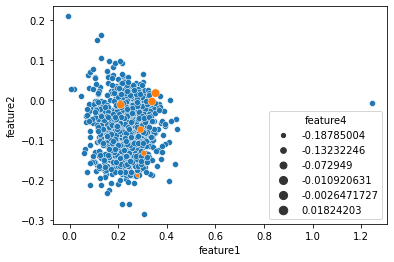

In [99]:
# inputs
feature1 = plot_list1[0:1000]
feature2= plot_list2[0:1000]
feature3= plot_list3
feature4= plot_list4
# convert to pandas dataframe
d = {'feature1': feature1, 'feature2': feature2}
pdnumsqr = pd.DataFrame(d)


d1 = {'feature3': feature3,'feature4': feature4}
pdnumsqr1 = pd.DataFrame(d1)
# plot using lineplot
#sns.set(style='darkgrid')
#sns.lineplot(x='num', y='sqr', data=pdnumsqr)

sns.scatterplot(x='feature1', y='feature2', data=pdnumsqr)
sns.scatterplot(x='feature3', y='feature4', data=pdnumsqr1, size="feature4")

Text(0, 0.5, 'Inertia')

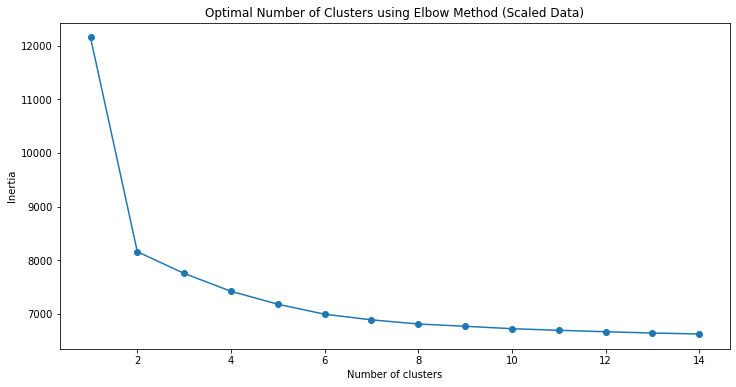

In [100]:
sse = []
k_list = range(1, 15)
for k in k_list:
    km = KMeans(n_clusters=k)
    km.fit(X_train)
    sse.append([k, km.inertia_])
    
oca_results_scale = pd.DataFrame({'Cluster': range(1,15), 'SSE': sse})
plt.figure(figsize=(12,6))
plt.plot(pd.DataFrame(sse)[0], pd.DataFrame(sse)[1], marker='o')
plt.title('Optimal Number of Clusters using Elbow Method (Scaled Data)')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')

In [101]:
songs_df_scale2 = X_train
kmeans_scale = KMeans(n_clusters=24, n_init=100, max_iter=400, init='k-means++', random_state=42).fit(songs_df_scale2)
#print('KMeans Scaled Silhouette Score: {}'.format(silhouette_score(df_scale2, kmeans_scale.labels_, metric='euclidean')))
labels_scale = kmeans_scale.labels_
clusters_scale = pd.concat([songs_df, pd.DataFrame({'cluster_scaled':labels_scale})], axis=1)

In [102]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score

In [103]:
len(['classic rock', 'hard rock', 'new jack swing', 'neo soul',
       'dance pop', 'urban contemporary', 'big room', 'hip pop',
       'latin pop', 'indie poptimism', 'gangster rap', 'album rock',
       'post-teen pop', 'trap', 'latin hip hop', 'southern hip hop',
       'tropical', 'electropop', 'progressive electro house', 'pop edm',
       'reggaeton', 'hip hop', 'permanent wave', 'electro house'])

24

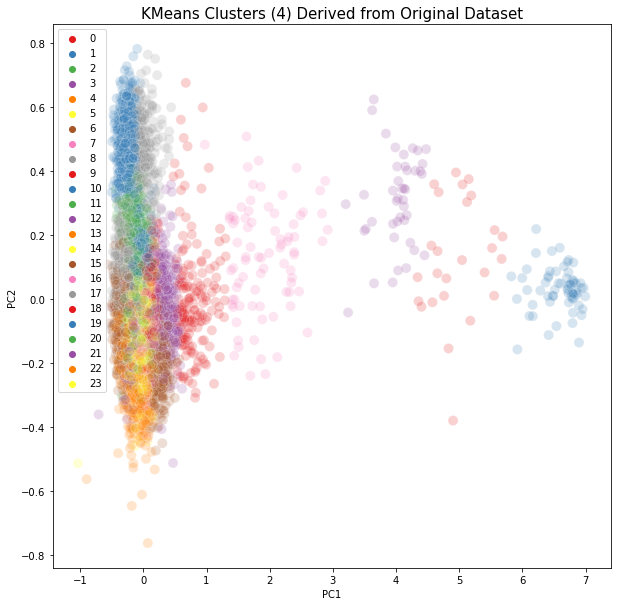

In [104]:
pca2 = PCA(n_components=3).fit(X_train)
pca2d = pca2.transform(X_train)
plt.figure(figsize = (10,10))
sns.scatterplot(pca2d[:,0], pca2d[:,1], 
                hue=labels_scale, 
                palette='Set1',
                s=100, alpha=0.2).set_title('KMeans Clusters (4) Derived from Original Dataset', fontsize=15)
plt.legend()
plt.ylabel('PC2')
plt.xlabel('PC1')
plt.show()

In [105]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
import plotly.offline as pyo
pyo.init_notebook_mode()
import plotly.graph_objs as go
from plotly import tools
from plotly.subplots import make_subplots
import plotly.offline as py
import plotly.express as px

In [106]:
Scene = dict(xaxis = dict(title  = 'PC1'),yaxis = dict(title  = 'PC2'),zaxis = dict(title  = 'PC3'))
labels = labels_scale
trace = go.Scatter3d(x=pca2d[:,0], y=pca2d[:,1], z=pca2d[:,2], mode='markers',marker=dict(color = labels, colorscale='Viridis', size = 10, line = dict(color = 'gray',width = 5)))
layout = go.Layout(margin=dict(l=0,r=0),scene = Scene, height = 1000,width = 1000)
data = [trace]
fig = go.Figure(data = data, layout = layout)
fig.show()

### applying on given lyrics and sub genre and plot the centroids and distances

In [107]:
labels = km.labels_
cluster_center=km.cluster_centers_

In [108]:
labels

array([ 5,  4,  0, ..., 11, 12,  2])

In [109]:
cluster_center

array([[ 0.22648406, -0.08012262, -0.7124216 , ...,  0.42862622,
         0.03629343,  0.07886824],
       [ 0.09670789,  0.09480397, -0.24328508, ...,  0.24816862,
         0.01527322, -0.00475838],
       [ 0.19090804, -0.04133702, -0.65276857, ...,  0.45856731,
         0.04583599,  0.05882556],
       ...,
       [ 0.23287188, -0.0844772 , -0.76987466, ...,  0.45741567,
         0.06502871,  0.08620354],
       [ 0.24353493, -0.07712597, -0.69885492, ...,  0.42099522,
         0.04242334,  0.07277998],
       [ 0.22037386, -0.08885303, -0.73729689, ...,  0.44316527,
         0.05953103,  0.07162169]])

In [110]:
pca2 = PCA(n_components=3).fit(cluster_center)
pca2d = pca2.transform(cluster_center)


In [111]:
pca2d 

array([[-0.90772291, -0.08635836, -0.02080859],
       [ 3.37700752,  0.43047901,  0.02193983],
       [-1.0656535 ,  0.04240664,  0.46259724],
       [-0.81079197,  0.0070069 , -0.03747607],
       [-0.93795889, -0.19933859, -0.14792128],
       [-0.2379314 ,  0.15031539, -0.08422499],
       [-1.07914073, -0.11566096,  0.04264083],
       [ 5.63117084, -0.4510065 ,  0.0364531 ],
       [-1.01005585, -0.06456711, -0.13554633],
       [ 0.97483505,  0.52368381, -0.09054361],
       [-1.09151241,  0.02451741,  0.0706276 ],
       [-1.20078508, -0.04501005, -0.01403127],
       [-0.68000641, -0.10199607, -0.12986166],
       [-0.96145426, -0.11447153,  0.02615521]])

In [112]:
pca2d[:,0]

array([-0.90772291,  3.37700752, -1.0656535 , -0.81079197, -0.93795889,
       -0.2379314 , -1.07914073,  5.63117084, -1.01005585,  0.97483505,
       -1.09151241, -1.20078508, -0.68000641, -0.96145426])

In [113]:
pca2d[:,1]

array([-0.08635836,  0.43047901,  0.04240664,  0.0070069 , -0.19933859,
        0.15031539, -0.11566096, -0.4510065 , -0.06456711,  0.52368381,
        0.02451741, -0.04501005, -0.10199607, -0.11447153])

In [114]:
x1=[-1.03909666,  5.99248041, -0.71611195,  1.91077862,  0.2344573 ,
        4.5048928 , -0.41508964, -1.03659418, -2.38635793, -0.79701702,
       -0.78228138, -0.55978923, -1.0686025 , -3.84166863]

In [115]:
y1=[-0.92182556,  2.08898292, -0.9700991 , -0.26837988, -0.70281529,
        0.80296394, -0.90380194, -0.89827291,  0.31712514, -0.94786527,
       -0.88760456, -1.17224456, -0.94386639,  5.40770347]

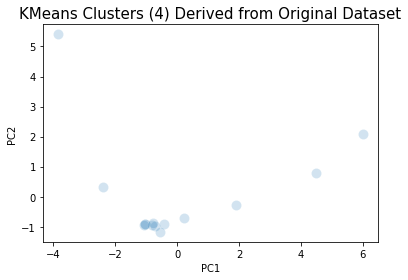

In [116]:
#plt.figure(figsize = (10,10))
sns.scatterplot(x1, y1 ,
                palette='Set2',
                s=100, alpha=0.2).set_title('KMeans Clusters (4) Derived from Original Dataset', fontsize=15)
plt.ylabel('PC2')
plt.xlabel('PC1')
plt.show()

In [117]:
pca21 = PCA(n_components=3).fit(X_train)
pca21d = pca21.transform(X_train)

In [118]:
pca21d

array([[ 0.93157982,  0.00561722, -0.25645413],
       [-0.0803905 , -0.26597326, -0.0213124 ],
       [-0.06192392, -0.06489725,  0.07906436],
       ...,
       [-0.21842442, -0.02309091,  0.04701203],
       [ 0.1395    , -0.20432404,  0.07012556],
       [-0.22362344,  0.66222183,  0.16473505]])

In [119]:
x2=[ 1.51313243e+00]
y2=[ 4.46942163e-04]

In [120]:
label=["sub gener 1","sub gener 2","sub gener 3","sub gener 4","sub gener 5","sub gener 6","sub gener 7","sub gener 8","sub gener 9","sub gener 10","sub gener 11","sub gener 12","sub gener 13","sub gener 14"]

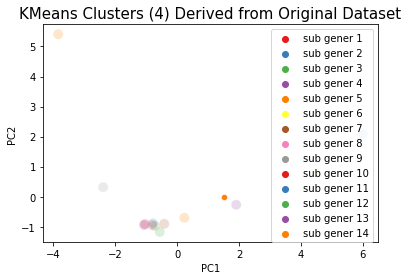

In [121]:
#plt.figure(figsize = (10,10))
sns.scatterplot(x1, y1,hue=label,
                palette='Set1',
                s=100, alpha=0.2).set_title('KMeans Clusters (4) Derived from Original Dataset', fontsize=15)
sns.scatterplot(x2, y2)
plt.ylabel('PC2')
plt.xlabel('PC1')
plt.show()

In [122]:
import plotly.express as px
df = px.data.iris()
fig = px.scatter( x=x1, y=y1,color=label)

fig.show()

### Other visualization over the dataset

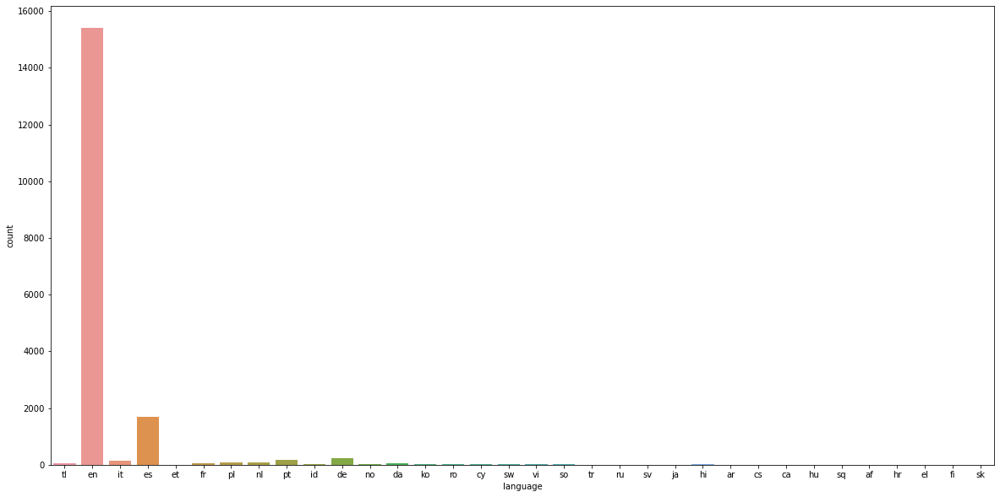

In [123]:
# import seaborn as sns
# import matplotlib.pyplot as plt
fig,ax = plt.subplots(figsize=(20,10))
ax = sns.countplot(x='language', data=songs_df)

In [131]:
songs_df_en = songs_df[songs_df['language'] == 'en']
songs_df_en['language'].value_counts()

en    15405
Name: language, dtype: int64

<AxesSubplot:>

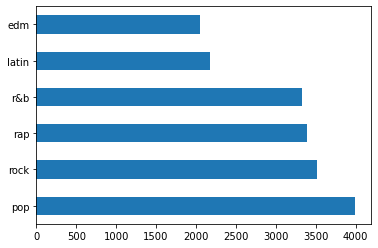

In [136]:
songs_df['playlist_genre'].value_counts().head(10).plot(kind='barh')

<AxesSubplot:>

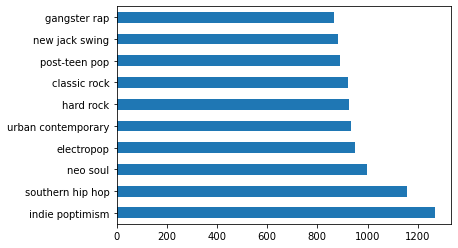

In [134]:
songs_df['playlist_subgenre'].value_counts().head(10).plot(kind='barh')